# **Richard Finney 500621132**

#**Option 1 Selected (Project Number 2):**
#**Abalone Dataset, Classification Task, Target Value: 'Sex'**

**The project will be conducted across the following phases:**

1) Importing Dataset and Exploratory Data Analysis (EDA)

2) Pycaret Model benchmarking on raw features in Multiclass Classification Task

3) Exploration of the effects of Pycaret Model Featuring Engineering & Hyperparamter tuning on Model Performance

4) Pycaret Model Perfomance Improvement through Feature Engineering & Data Preparation in Multiclass Classification Task

5) Pycaret Model Performance Improvement through One vs. All Multiclass Classification Approach

6) Use of Tensorflow Neural Networks for comparison to Pycaret Model Performance



## **1) Importing Dataset and Exploratory Data Analysis (EDA)**

Ectracting dataset from https://archive.ics.uci.edu/dataset/1/abalone and importing into Python Pandas Dataframe

In [ ]:
!pip install ucimlrepo

In [ ]:
#Copy and pasted Python import instructions from https://archive.ics.uci.edu/dataset/1/abalone

from ucimlrepo import fetch_ucirepo
import pandas as pd

# fetch dataset
abalone = fetch_ucirepo(id=1)

# data (as pandas dataframes)
X = abalone.data.features
y = abalone.data.targets

data = pd.concat([X, y], axis=1)

# metadata
print(abalone.metadata)

# variable information
print(abalone.variables)

#visualize full table
data

{'uci_id': 1, 'name': 'Abalone', 'repository_url': 'https://archive.ics.uci.edu/dataset/1/abalone', 'data_url': 'https://archive.ics.uci.edu/static/public/1/data.csv', 'abstract': 'Predict the age of abalone from physical measurements', 'area': 'Life Science', 'tasks': ['Classification', 'Regression'], 'characteristics': ['Tabular'], 'num_instances': 4177, 'num_features': 8, 'feature_types': ['Categorical', 'Integer', 'Real'], 'demographics': [], 'target_col': ['Rings'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1994, 'last_updated': 'Mon Aug 28 2023', 'dataset_doi': '10.24432/C55C7W', 'creators': ['Warwick Nash', 'Tracy Sellers', 'Simon Talbot', 'Andrew Cawthorn', 'Wes Ford'], 'intro_paper': None, 'additional_info': {'summary': 'Predicting the age of abalone from physical measurements.  The age of abalone is determined by cutting the shell through the cone, staining it, and counting the number of rings through a microscop

,Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,F,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,M,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,M,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,F,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


Now that that data has been imported into a Pandas Dataframe, we can begin to understand the data we are working with to decide how the model should be developed and evaluated.

We first check the taget column 'Sex' to check counts of each class to determine if we are working with a balanced dataset.

In [ ]:
data['Sex'].value_counts()

M    1528
I    1342
F    1307
Name: Sex, dtype: int64

From this check of the target 'Sex' Column, we see there are three classes: 'M' referring to Male, 'I' corresponding to Infant, F meaning 'female

It seems from this check that the class distribution is resonably balanced. We might be able to further improve perfomance by discarding samples to ensure perfect balance (i.e. 1307 samples of each class in the 'Sex' target column).

Next, we will derive insight from our feature and target variables i.e. data types: are they numerical, categorical? Will categorical features need one-hot encoding? Are there null values that require imputation? How many samples to we have? etc.

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4177 entries, 0 to 4176
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Sex             4177 non-null   object 
 1   Length          4177 non-null   float64
 2   Diameter        4177 non-null   float64
 3   Height          4177 non-null   float64
 4   Whole_weight    4177 non-null   float64
 5   Shucked_weight  4177 non-null   float64
 6   Viscera_weight  4177 non-null   float64
 7   Shell_weight    4177 non-null   float64
 8   Rings           4177 non-null   int64  
dtypes: float64(7), int64(1), object(1)
memory usage: 293.8+ KB


We see that all 8 features are numerical and the target is of object type (which is converted to categorical below). Thus, one-hot encoding is not necessary as no features are categorical.

It also seems that no features have null values, thus feature imputation is not needed in this project.

Further, we see that the features are all physical attributes of the Abalone. Thus, we come to the understanding that we are attempting to train a ML model on 8 physical features to predict 1 of 3 different 'Sex' classes.

In [ ]:
data['Sex'] = data['Sex'].astype('category')

In [ ]:
data.describe()

,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
count,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000
mean,0.523992,0.407881,0.139516,0.828742,0.359367,0.180594,0.238831,9.933684
std,0.120093,0.099240,0.041827,0.490389,0.221963,0.109614,0.139203,3.224169
min,0.075000,0.055000,0.000000,0.002000,0.001000,0.000500,0.001500,1.000000
25%,0.450000,0.350000,0.115000,0.441500,0.186000,0.093500,0.130000,8.000000
50%,0.545000,0.425000,0.140000,0.799500,0.336000,0.171000,0.234000,9.000000
75%,0.615000,0.480000,0.165000,1.153000,0.502000,0.253000,0.329000,11.000000
max,0.815000,0.650000,1.130000,2.825500,1.488000,0.760000,1.005000,29.000000


# EDA - Visualization

In [ ]:
pd.plotting.scatter_matrix(data, c = data['Sex'].cat.codes, figsize = [100, 100], s=4177);

From EDA above, we see that there is a clear distinction between the 'Infant' Sex and other classes. However, there is not a clear separation between the Male and Females classes. Thus, I hypothesize that the model will be perform well (high precision & recall) in identifying the 'Infant' class, but will perform poorly in identifying Males and Females.

# **2) Pycaret Model benchmarking on raw features in Multiclass Classification Task**

In this section, I benchmark Pycaret model performance on raw, unprocessed featurs to classify the 'Sex' target column without peforming Feature Engineering. This is done to establish bare-minimum peformance and quantify how much performance improvement is possible through feature engineering.

I will be using the Pycaret Multiclass Classification Tutorial notebook as a guide.

A typical workflow in PyCaret consist of following 5 steps in this order, which will be completed in this section:

## **Setup** ➡️ **Compare Models** ➡️ **Analyze Model** ➡️ **Prediction** ➡️ **Save Model**

In [ ]:
!pip install pycaret[full]

In [ ]:
# check installed version
import pycaret
pycaret.__version__

'3.1.0'

In [ ]:
# import pycaret classification and init setup
from pycaret.classification import *
s = setup(data, target = 'Sex', session_id = 123)

,Description,Value
0,Session id,123
1,Target,Sex
2,Target type,Multiclass
3,Target mapping,"F: 0, I: 1, M: 2"
4,Original data shape,"(4177, 9)"
5,Transformed data shape,"(4177, 9)"
6,Transformed train set shape,"(2923, 9)"
7,Transformed test set shape,"(1254, 9)"
8,Numeric features,8
9,Preprocess,True


In [ ]:
# import ClassificationExperiment and init the class
from pycaret.classification import ClassificationExperiment
exp = ClassificationExperiment()

In [ ]:
# check the type of exp
type(exp)

pycaret.classification.oop.ClassificationExperiment

## Setup
This function initializes the training environment and creates the transformation pipeline. Setup function must be called before executing any other function in PyCaret. It only has two required parameters i.e. `data` and `target`. All the other parameters are optional.

In [ ]:
# init setup on exp
exp.setup(data, target = 'Sex', session_id = 123)

,Description,Value
0,Session id,123
1,Target,Sex
2,Target type,Multiclass
3,Target mapping,"F: 0, I: 1, M: 2"
4,Original data shape,"(4177, 9)"
5,Transformed data shape,"(4177, 9)"
6,Transformed train set shape,"(2923, 9)"
7,Transformed test set shape,"(1254, 9)"
8,Numeric features,8
9,Preprocess,True


From this summary, we see that there are 8 numeric featurs to classify the 'Sex' target column. This is a multiclass classification problem, as there are three target classes: Female (Class 0), Infant (Class 1), and Male (Class 2).

## Compare Models

This function trains and evaluates the performance of all the estimators available in the model library using cross-validation. The output of this function is a scoring grid with average cross-validated scores (of default 10 folds).

In [ ]:
# compare baseline models
best = compare_models()
best_models = best

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.5549,0.7544,0.5549,0.5462,0.5370,0.3267,0.3343,1.2290
ridge,Ridge Classifier,0.5491,0.0000,0.5491,0.5358,0.5304,0.3210,0.3279,0.0630
lda,Linear Discriminant Analysis,0.5484,0.7497,0.5484,0.5412,0.5394,0.3186,0.3216,0.0370
gbc,Gradient Boosting Classifier,0.5481,0.7433,0.5481,0.5369,0.5373,0.3176,0.3207,2.2080
rf,Random Forest Classifier,0.5436,0.7409,0.5436,0.5365,0.5384,0.3125,0.3135,1.0260
catboost,CatBoost Classifier,0.5412,0.7383,0.5412,0.5355,0.5370,0.3096,0.3103,7.2650
et,Extra Trees Classifier,0.5330,0.7361,0.5330,0.5250,0.5274,0.2973,0.2982,0.3920
lightgbm,Light Gradient Boosting Machine,0.5323,0.7334,0.5323,0.5262,0.5282,0.2960,0.2966,1.2970
ada,Ada Boost Classifier,0.5316,0.7280,0.5316,0.5142,0.5086,0.2920,0.2995,0.4880
svm,SVM - Linear Kernel,0.5269,0.0000,0.5269,0.4707,0.4347,0.2801,0.3459,0.1440


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

In [ ]:
# compare models using OOP
exp.compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.5549,0.7544,0.5549,0.5462,0.5370,0.3267,0.3343,0.1810
ridge,Ridge Classifier,0.5491,0.0000,0.5491,0.5358,0.5304,0.3210,0.3279,0.0650
lda,Linear Discriminant Analysis,0.5484,0.7497,0.5484,0.5412,0.5394,0.3186,0.3216,0.0370
gbc,Gradient Boosting Classifier,0.5481,0.7433,0.5481,0.5369,0.5373,0.3176,0.3207,2.0350
rf,Random Forest Classifier,0.5436,0.7409,0.5436,0.5365,0.5384,0.3125,0.3135,0.6400
catboost,CatBoost Classifier,0.5412,0.7383,0.5412,0.5355,0.5370,0.3096,0.3103,7.1960
et,Extra Trees Classifier,0.5330,0.7361,0.5330,0.5250,0.5274,0.2973,0.2982,0.4020
lightgbm,Light Gradient Boosting Machine,0.5323,0.7334,0.5323,0.5262,0.5282,0.2960,0.2966,1.1010
ada,Ada Boost Classifier,0.5316,0.7280,0.5316,0.5142,0.5086,0.2920,0.2995,0.2070
svm,SVM - Linear Kernel,0.5269,0.0000,0.5269,0.4707,0.4347,0.2801,0.3459,0.1320


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

From the model comparison above, we see that the raw feature data gives poor accuracy performance across the models - ranging from 37% to 55%. Other perfomance metrics, such as Recall, Percision and F1 are also very poor. AUC is the strongest metric among model performance, ranging between 0.5 - 0.7544.

Based on the undertanding of the dataset and multiclass classification problem, **I believe the AUC metric is the performance metric that should be chosen to compare the models**. This is due to several factors.

The first being **Threshold Indepdendance for Each Class**: In multiclass classification, accuracy can be sensitive to the choice of a classification threshold for each class. AUC is threshold-independent for each class because it evaluates the probability scores and ranking of class membership, which is crucial when dealing with multiple classes.

Another factor is **Class-Specific Performance**: AUC for each class can offer a way to assess how well the model distinguishes between one class and all the others. This allows you to identify which classes the model performs better on and which classes it struggles with, which can be valuable information for decision-makers.

Another deciding factor is **Visual Interpretation**: Visual aids can help in presenting the concept to your supervisor. You can show how well the model separates different classes by displaying the ROC curve for each class.

AUC is determined using a one vs. all classification approach (i.e. Female, not Female) for classification. In section 5) I will do a deeper study of this concept by performing one vs. all classification for each 'Sex' class: Male, Infant and Female to note effects to all performance metrics.

The Logistic Regression (LR) model is by far the strongest performer, achieving highest performance in 5/7 metrics. Based on this, the LR model would be selected for multiclass classification for the 'Sex' target column in the Abalone dataset.

# **Analyze Model**

## **Confusion Matrix**

Below, a confusion matrix based on the best model (Logistic Regression) performance is plotted.

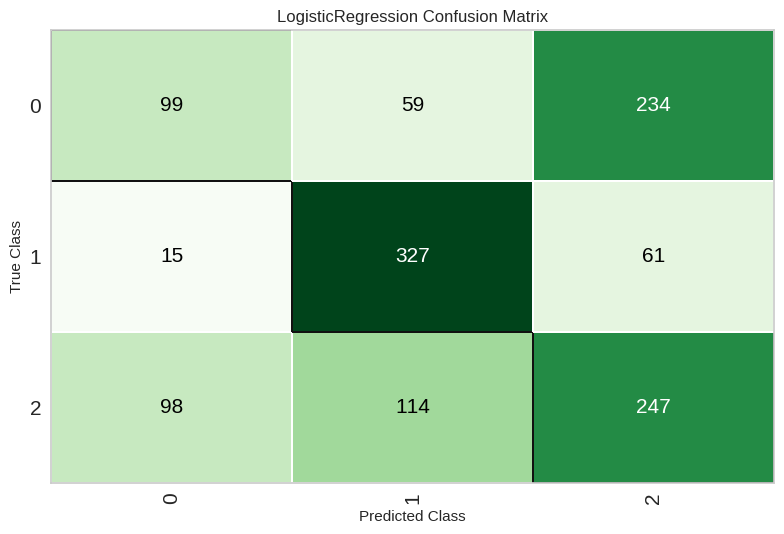

In [ ]:
# plot confusion matrix
plot_model(best, plot = 'confusion_matrix')

As suspected during the EDA phase of the project, it seems from the confusion matrix above, the model is really good at classifying Abalones of the Infant 'Sex' (class 1) - with a recall of 81%


Unforunately, it seems that my suspicion during EDA of poor performance in classifying Males and Females was also correct. It's recall in classifying Females (class 0) is 25% and Males (class 2) is 69%. It seems that the model is incorrectly classifying Females (class 0) as Males (Class 2). This will be further investigation in the feature engineering section of this project.

## **AUC Plot**

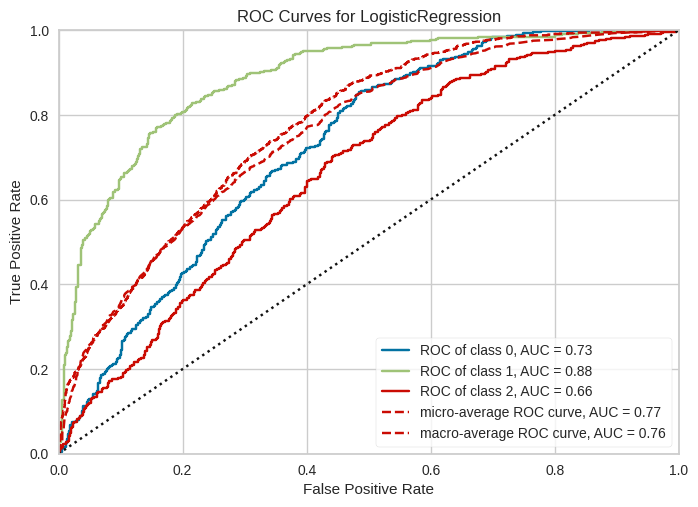

In [ ]:
plot_model(best, plot = 'auc')

## **Feature Importance Plot**

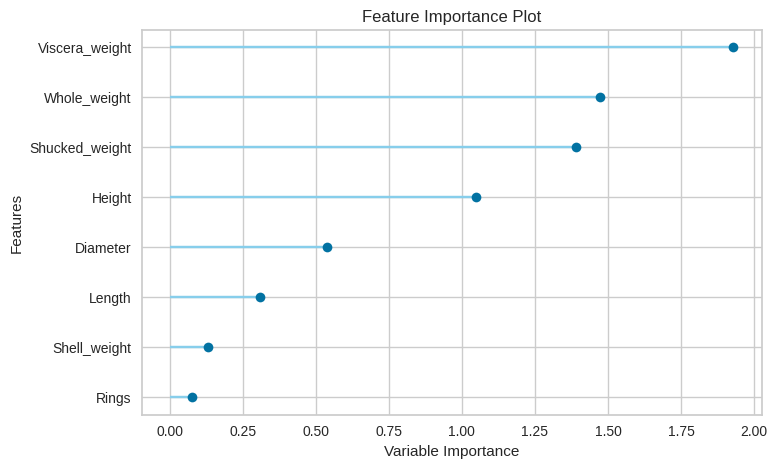

In [ ]:
plot_model(best, plot = 'feature')

From the Feature Importance Plot above, we see that 'Viscera_weight' is the most important feature in the 'Sex' multiclass classification problem. Additionally we see that 'Whole_weight', 'Shucked_weight' and 'Height' are also good predictors of the target 'Sex' column. The other four features, ('Diameter', 'Length', 'Shell_weight' 'Rings') however, are poor predictors of the 'Sex' target class, and in the section section of this project, may be dropped as features to improve model performance.

In [ ]:
# check docstring to see available plots
help(plot_model)

Help on function plot_model in module pycaret.classification.functional:

plot_model(estimator, plot: str = 'auc', scale: float = 1, save: bool = False, fold: Union[int, Any, NoneType] = None, fit_kwargs: Optional[dict] = None, plot_kwargs: Optional[dict] = None, groups: Union[str, Any, NoneType] = None, verbose: bool = True, display_format: Optional[str] = None) -> Optional[str]
    This function analyzes the performance of a trained model on holdout set.
    It may require re-training the model in certain cases.
    
    Example
    -------
    >>> from pycaret.datasets import get_data
    >>> juice = get_data('juice')
    >>> from pycaret.classification import *
    >>> exp_name = setup(data = juice,  target = 'Purchase')
    >>> lr = create_model('lr')
    >>> plot_model(lr, plot = 'auc')
    
    
    estimator: scikit-learn compatible object
        Trained model object
    
    
    plot: str, default = 'auc'
        List of available plots (ID - Name):
    
        * 'pipeline'

In [ ]:
#evaluating best model
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Prediction
The `predict_model` function returns `prediction_label` and `prediction_score` (probability of the predicted class) as new columns in dataframe.

In [ ]:
# predict on test set
holdout_pred = predict_model(best)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.5367,0.7536,0.5367,0.5230,0.5159,0.2989,0.3062


In [ ]:
# show predictions df
holdout_pred.head()

,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings,Sex,prediction_label,prediction_score
1948,0.635,0.515,0.165,1.2290,0.5055,0.2975,0.3535,10,2,F,0.4948
956,0.495,0.400,0.135,0.6100,0.2720,0.1435,0.1440,7,2,I,0.5158
1341,0.585,0.490,0.185,1.1710,0.5220,0.2535,0.3350,10,2,M,0.4996
821,0.370,0.275,0.140,0.2215,0.0970,0.0455,0.0615,6,1,I,0.8116
569,0.410,0.320,0.115,0.3870,0.1650,0.1005,0.0985,11,0,I,0.4536


The same function works for predicting the labels on unseen dataset. Let's create a copy of original data and drop the `Class variable`. We can then use the new data frame without labels for scoring.

In [ ]:
# copy data and drop Class variable

new_data = data.copy()
new_data.drop('Sex', axis=1, inplace=True)
new_data.head()

,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
0,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15
1,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
2,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
3,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
4,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7


In [ ]:
# predict model on new_data
predictions = predict_model(best, data = new_data)
predictions.head()

,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings,prediction_label,prediction_score
0,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15,M,0.4599
1,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7,I,0.7620
2,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9,I,0.3888
3,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10,I,0.4140
4,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7,I,0.7656


## Save Model

Now we save the entire pipeline on disk for later use, using pycaret's `save_model` function.

In [ ]:
# save pipeline
save_model(best, 'my_first_pipeline')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('label_encoding',
                  TransformerWrapperWithInverse(exclude=None, include=None,
                                                transformer=LabelEncoder())),
                 ('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Length', 'Diameter', 'Height',
                                              'Whole_weight', 'Shucked_weight',
                                              'Viscera_weight', 'Shell_weight',
                                              'Rings'],
                                     transformer=SimpleImputer(add_indicato...
                                                               keep_empty_features=False,
                                                               missing_values=nan,
                                                               strategy='most_frequent',
                                             

In [ ]:
# load pipeline
loaded_best_pipeline = load_model('my_first_pipeline')
loaded_best_pipeline

Transformation Pipeline and Model Successfully Loaded


Pipeline(memory=FastMemory(location=/tmp/joblib),
         steps=[('label_encoding',
                 TransformerWrapperWithInverse(exclude=None, include=None,
                                               transformer=LabelEncoder())),
                ('numerical_imputer',
                 TransformerWrapper(exclude=None,
                                    include=['Length', 'Diameter', 'Height',
                                             'Whole_weight', 'Shucked_weight',
                                             'Viscera_weight', 'Shell_weight',
                                             'Rings'],
                                    transformer=SimpleImputer(a...
                                                              keep_empty_features=False,
                                                              missing_values=nan,
                                                              strategy='most_frequent',
                                                              verbose='deprecated'))),
                ('trained_model',
                 LogisticRegression(C=1.0, class_weight=None, dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=1000,
                                    multi_class='auto', n_jobs=None,
                                    penalty='l2', random_state=123,
                                    solver='lbfgs', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)

# **3) Exploration of the effects of Pycaret Model Featuring Engineering & Hyperparamter tuning on Model Performance**

In the previous section, we noted that without any feature engineering or parameter tuning, the best performing Pycaret model (Logistic Regression) was able to achieve 54.49% Accuracy, AUC of 0.7544, Recall of 55.49%, Precision of 54.62% and F1 of 53.94%

In this section, I explore the effects of Pycaret Model Feature Engineering & Hyperparamter tuning on Model performance to gather insight on the ML tools available to ML Engineer.

I use the information gathered in this section to produce optimal feature engineering & hyper paramter tuning to improve model performance in section 4).



To access all the variables created by the setup function such as transformed dataset, random_state, etc. you can use `get_config` method.

In [ ]:
# check all available config
get_config()

{'USI',
 'X',
 'X_test',
 'X_test_transformed',
 'X_train',
 'X_train_transformed',
 'X_transformed',
 '_available_plots',
 '_ml_usecase',
 'data',
 'dataset',
 'dataset_transformed',
 'exp_id',
 'exp_name_log',
 'fix_imbalance',
 'fold_generator',
 'fold_groups_param',
 'fold_shuffle_param',
 'gpu_n_jobs_param',
 'gpu_param',
 'html_param',
 'idx',
 'is_multiclass',
 'log_plots_param',
 'logging_param',
 'memory',
 'n_jobs_param',
 'pipeline',
 'seed',
 'target_param',
 'test',
 'test_transformed',
 'train',
 'train_transformed',
 'variable_and_property_keys',
 'variables',
 'y',
 'y_test',
 'y_test_transformed',
 'y_train',
 'y_train_transformed',
 'y_transformed'}

In [ ]:
# lets access X_train_transformed
get_config('X_train_transformed')

,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
629,0.340,0.265,0.085,0.1835,0.0770,0.0460,0.0650,10.0
1496,0.620,0.480,0.165,1.0725,0.4815,0.2350,0.3120,9.0
323,0.265,0.205,0.070,0.1055,0.0390,0.0410,0.0350,5.0
2473,0.615,0.470,0.175,1.2985,0.5135,0.3430,0.3200,14.0
3996,0.315,0.230,0.000,0.1340,0.0575,0.0285,0.3505,6.0
...,...,...,...,...,...,...,...,...
4140,0.645,0.535,0.190,1.2395,0.4680,0.2385,0.4240,10.0
2478,0.470,0.355,0.180,0.4410,0.1525,0.1165,0.1350,8.0
3060,0.630,0.515,0.175,1.1955,0.4920,0.2470,0.3700,11.0
3939,0.555,0.420,0.145,0.8695,0.3075,0.2575,0.2500,14.0


In [ ]:
# another example: let's access seed
print("The current seed is: {}".format(get_config('seed')))

# now lets change it using set_config
set_config('seed', 786)
print("The new seed is: {}".format(get_config('seed')))

The current seed is: 123
The new seed is: 786


In [ ]:
# init setup with normalize = True

s = setup(data, target = 'Sex', session_id = 123,
          normalize = True, normalize_method = 'minmax')

,Description,Value
0,Session id,123
1,Target,Sex
2,Target type,Multiclass
3,Target mapping,"F: 0, I: 1, M: 2"
4,Original data shape,"(4177, 9)"
5,Transformed data shape,"(4177, 9)"
6,Transformed train set shape,"(2923, 9)"
7,Transformed test set shape,"(1254, 9)"
8,Numeric features,8
9,Preprocess,True


<Axes: >

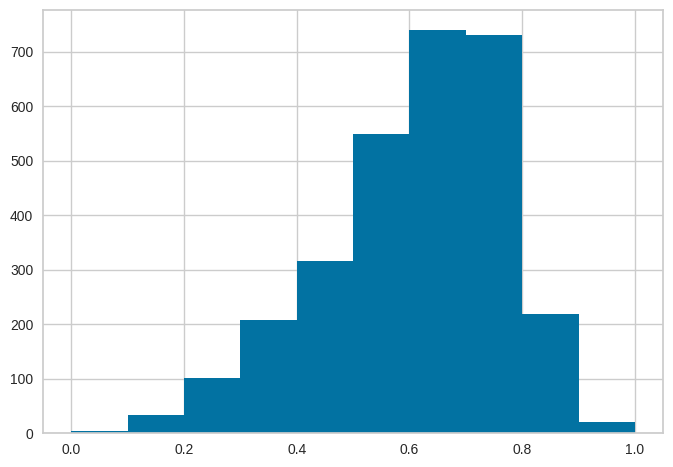

In [ ]:
# lets check the X_train_transformed to see effect of params passed
get_config('X_train_transformed')['Length'].hist()

Notice that all the values are between 0 and 1 - that is because we passed `normalize=True` in the `setup` function.

## ✅ Compare Models
This function trains and evaluates the performance of all estimators available in the model library using cross-validation. The output of this function is a scoring grid with average cross-validated scores. Metrics evaluated during CV can be accessed using the `get_metrics` function. Custom metrics can be added or removed using `add_metric` and `remove_metric` function.

In [ ]:
best = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.5566,0.7539,0.5566,0.5484,0.5400,0.3296,0.3366,0.1640
svm,SVM - Linear Kernel,0.5563,0.0000,0.5563,0.5114,0.5155,0.3292,0.3529,0.0610
ridge,Ridge Classifier,0.5525,0.0000,0.5525,0.5398,0.5346,0.3264,0.3330,0.0390
lda,Linear Discriminant Analysis,0.5484,0.7497,0.5484,0.5412,0.5394,0.3186,0.3216,0.0840
gbc,Gradient Boosting Classifier,0.5481,0.7435,0.5481,0.5369,0.5374,0.3176,0.3207,1.7440
rf,Random Forest Classifier,0.5416,0.7406,0.5416,0.5346,0.5366,0.3095,0.3104,0.6020
catboost,CatBoost Classifier,0.5409,0.7383,0.5409,0.5352,0.5367,0.3090,0.3098,7.2020
lightgbm,Light Gradient Boosting Machine,0.5347,0.7366,0.5347,0.5282,0.5298,0.2993,0.3002,1.1650
et,Extra Trees Classifier,0.5330,0.7360,0.5330,0.5251,0.5274,0.2973,0.2982,0.6970
ada,Ada Boost Classifier,0.5316,0.7280,0.5316,0.5142,0.5086,0.2920,0.2995,0.4440


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

We can see through minmax feature normalization, performance has very slightly increased in the Logistic Regression model. I.e Accuracy has increased from 0.5549 -> 0.5566, F1 has increased from 0.5370 to 0.54. An interesting development is that the LR model now has the best performance across 6/7 metrics - an improvement from 5/7 metrics in the unnormalized model.

In [ ]:
# check available models
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


Using the `include` paramter in the `compare_models` to train and compare only tree models; of which we see the Gradient Boosting Classifier peform the best across the board.

In [ ]:
compare_tree_models = compare_models(include = ['dt', 'rf', 'et', 'gbc', 'xgboost', 'lightgbm', 'catboost'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.5481,0.7435,0.5481,0.5369,0.5374,0.3176,0.3207,1.8600
rf,Random Forest Classifier,0.5416,0.7406,0.5416,0.5346,0.5366,0.3095,0.3104,0.5370
catboost,CatBoost Classifier,0.5409,0.7383,0.5409,0.5352,0.5367,0.3090,0.3098,7.2260
lightgbm,Light Gradient Boosting Machine,0.5347,0.7366,0.5347,0.5282,0.5298,0.2993,0.3002,1.1070
et,Extra Trees Classifier,0.5330,0.7360,0.5330,0.5251,0.5274,0.2973,0.2982,0.5130
xgboost,Extreme Gradient Boosting,0.5210,0.7237,0.5210,0.5152,0.5170,0.2787,0.2793,0.5340
dt,Decision Tree Classifier,0.4837,0.6111,0.4837,0.4847,0.4834,0.2247,0.2250,0.0530


Processing:   0%|          | 0/33 [00:00<?, ?it/s]

In [ ]:
compare_tree_models

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

The function above has return trained model object as an output. The scoring grid is only displayed and not returned. We can can also pull data into data frame with the `pull` function

In [ ]:
compare_tree_models_results = pull()
compare_tree_models_results

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.5481,0.7435,0.5481,0.5369,0.5374,0.3176,0.3207,1.860
rf,Random Forest Classifier,0.5416,0.7406,0.5416,0.5346,0.5366,0.3095,0.3104,0.537
catboost,CatBoost Classifier,0.5409,0.7383,0.5409,0.5352,0.5367,0.3090,0.3098,7.226
lightgbm,Light Gradient Boosting Machine,0.5347,0.7366,0.5347,0.5282,0.5298,0.2993,0.3002,1.107
et,Extra Trees Classifier,0.5330,0.7360,0.5330,0.5251,0.5274,0.2973,0.2982,0.513
xgboost,Extreme Gradient Boosting,0.5210,0.7237,0.5210,0.5152,0.5170,0.2787,0.2793,0.534
dt,Decision Tree Classifier,0.4837,0.6111,0.4837,0.4847,0.4834,0.2247,0.2250,0.053


Using `compare_models` and the `sort` paramater to return the top three models based on `Recall` below:

In [ ]:
best_recall_models_top3 = compare_models(sort = 'Recall', n_select = 3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.5566,0.7539,0.5566,0.5484,0.5400,0.3296,0.3366,0.1380
svm,SVM - Linear Kernel,0.5563,0.0000,0.5563,0.5114,0.5155,0.3292,0.3529,0.1110
ridge,Ridge Classifier,0.5525,0.0000,0.5525,0.5398,0.5346,0.3264,0.3330,0.0790
lda,Linear Discriminant Analysis,0.5484,0.7497,0.5484,0.5412,0.5394,0.3186,0.3216,0.0450
gbc,Gradient Boosting Classifier,0.5481,0.7435,0.5481,0.5369,0.5374,0.3176,0.3207,2.0410
rf,Random Forest Classifier,0.5416,0.7406,0.5416,0.5346,0.5366,0.3095,0.3104,0.6280
catboost,CatBoost Classifier,0.5409,0.7383,0.5409,0.5352,0.5367,0.3090,0.3098,7.1350
lightgbm,Light Gradient Boosting Machine,0.5347,0.7366,0.5347,0.5282,0.5298,0.2993,0.3002,0.8770
et,Extra Trees Classifier,0.5330,0.7360,0.5330,0.5251,0.5274,0.2973,0.2982,0.4970
ada,Ada Boost Classifier,0.5316,0.7280,0.5316,0.5142,0.5086,0.2920,0.2995,0.2200


Processing:   0%|          | 0/71 [00:00<?, ?it/s]

In [ ]:
# list of top 3 models by Recall
best_recall_models_top3

[LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                    intercept_scaling=1, l1_ratio=None, max_iter=1000,
                    multi_class='auto', n_jobs=None, penalty='l2',
                    random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                    warm_start=False),
 SGDClassifier(alpha=0.0001, average=False, class_weight=None,
               early_stopping=False, epsilon=0.1, eta0=0.001, fit_intercept=True,
               l1_ratio=0.15, learning_rate='optimal', loss='hinge',
               max_iter=1000, n_iter_no_change=5, n_jobs=-1, penalty='l2',
               power_t=0.5, random_state=123, shuffle=True, tol=0.001,
               validation_fraction=0.1, verbose=0, warm_start=False),
 RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                 max_iter=None, positive=False, random_state=123, solver='auto',
                 tol=0.0001)]

#Cross-Validation

In this section, I train and evalute the best performing model from the previous sections (Logistic Regression) using Cross Validation (CV) and compare the performance of 3-fold vs. 10-fold CV

In [ ]:
# train logistic regression with default fold=10
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5631,0.7479,0.5631,0.5588,0.5491,0.3399,0.3463
1,0.5836,0.7764,0.5836,0.5872,0.5763,0.3700,0.3755
2,0.5392,0.7508,0.5392,0.5280,0.5264,0.3030,0.3074
3,0.5856,0.7482,0.5856,0.5796,0.5580,0.3733,0.3869
4,0.5479,0.7467,0.5479,0.5334,0.5222,0.3139,0.3243
5,0.5205,0.7382,0.5205,0.5046,0.5048,0.2766,0.2806
6,0.5514,0.7517,0.5514,0.5469,0.5394,0.3205,0.3261
7,0.5514,0.7626,0.5514,0.5315,0.5343,0.3242,0.3283
8,0.5753,0.7488,0.5753,0.5784,0.5588,0.3566,0.3665


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

From above, we see we get identical LR model performance form Section 2 (which is to be expected as the default in pycaret is set to 10-Fold). Let us now evaluate model performanc eusing 3-fold CV.

In [ ]:
# train logistic regression with fold=3
lr = create_model('lr', fold=3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5651,0.7572,0.5651,0.5595,0.5538,0.3423,0.3472
1,0.5554,0.7464,0.5554,0.5498,0.5327,0.3270,0.3372
2,0.5595,0.7565,0.5595,0.5475,0.5420,0.3342,0.3407
Mean,0.5600,0.7533,0.5600,0.5523,0.5428,0.3345,0.3417
Std,0.0040,0.0049,0.0040,0.0052,0.0086,0.0063,0.0042


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Suprisingly, we actually see higher performance in some metrics using 3-fold CV instead of 10-fold CV. However, this is due to data splitting and does not indicate a better generalization (peformance on unseen samples).

In [ ]:
# train logistic regression with specific model parameters
create_model('lr', C = 0.5, l1_ratio = 0.15)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5563,0.7427,0.5563,0.5507,0.5371,0.3281,0.3369
1,0.5768,0.7730,0.5768,0.5853,0.5636,0.3579,0.3680
2,0.5427,0.7503,0.5427,0.5355,0.5252,0.3060,0.3145
3,0.5822,0.7461,0.5822,0.5847,0.5539,0.3672,0.3823
4,0.5411,0.7429,0.5411,0.5224,0.5106,0.3025,0.3146
5,0.5274,0.7347,0.5274,0.5185,0.5082,0.2840,0.2914
6,0.5377,0.7501,0.5377,0.5361,0.5204,0.2973,0.3068
7,0.5788,0.7601,0.5788,0.5661,0.5588,0.3633,0.3712
8,0.5616,0.7452,0.5616,0.5706,0.5410,0.3343,0.3475


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LogisticRegression(C=0.5, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=0.15, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
# train lr and return train score as well alongwith CV
create_model('lr', return_train_score=True)

Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

## ✅ Tune Model

This function tunes the hyperparameters of the model. The output of this function is a scoring grid with cross-validated scores by fold. The best model is selected based on the metric defined in optimize parameter. Metrics evaluated during cross-validation can be accessed using the `get_metrics` function.

In [ ]:
# train a dt model with default params
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.4915,0.6172,0.4915,0.5019,0.4946,0.2371,0.2382
1,0.5188,0.6366,0.5188,0.5261,0.5218,0.2767,0.2770
2,0.4949,0.6190,0.4949,0.5019,0.4974,0.2399,0.2402
3,0.4623,0.5956,0.4623,0.4545,0.4572,0.1934,0.1939
4,0.4692,0.6002,0.4692,0.4662,0.4676,0.2016,0.2016
5,0.4795,0.6084,0.4795,0.4767,0.4776,0.2190,0.2192
6,0.5000,0.6222,0.5000,0.5084,0.5038,0.2475,0.2477
7,0.4760,0.6058,0.4760,0.4702,0.4723,0.2136,0.2140
8,0.4692,0.6005,0.4692,0.4639,0.4658,0.2038,0.2041


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       random_state=123, splitter='best')

In [ ]:
# tune hyperparameters of dt
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5358,0.7554,0.5358,0.5482,0.5356,0.2966,0.3008
1,0.5392,0.7378,0.5392,0.5502,0.5132,0.2947,0.3191
2,0.5734,0.7495,0.5734,0.5959,0.5804,0.3567,0.3587
3,0.5445,0.7255,0.5445,0.5257,0.4937,0.3095,0.3305
4,0.5205,0.7447,0.5205,0.5015,0.4994,0.2790,0.2852
5,0.5000,0.7194,0.5000,0.4952,0.4972,0.2491,0.2493
6,0.5514,0.7555,0.5514,0.5572,0.5493,0.3202,0.3239
7,0.5445,0.7428,0.5445,0.5477,0.5403,0.3202,0.3244
8,0.5377,0.7296,0.5377,0.5324,0.5089,0.2926,0.3138


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


From the results above, we see that there is significant performance improvement in the Decision Tree model by tuning parameters. For exampl, AUC increase from 0.6111 to 0.7407. By default, pycaret optomizes the Accuracy paramter, however this can be changes. Below, we test out F1 optimization. Additionally, we test out custom tuned grids by adjusted max_depth of the Decision Tree model:

In [ ]:
# define tuning grid
dt_grid = {'max_depth' : [None, 2, 4, 6, 8, 10, 12]}

# tune model with custom grid and metric = F1
tuned_dt = tune_model(dt, custom_grid = dt_grid, optimize = 'F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5324,0.7483,0.5324,0.5353,0.5249,0.3034,0.3096
1,0.5666,0.7450,0.5666,0.5748,0.5544,0.3403,0.3528
2,0.5836,0.7535,0.5836,0.5990,0.5739,0.3660,0.3799
3,0.5548,0.7359,0.5548,0.5454,0.5457,0.3261,0.3292
4,0.5685,0.7335,0.5685,0.5626,0.5484,0.3432,0.3554
5,0.5171,0.7245,0.5171,0.5146,0.5125,0.2700,0.2720
6,0.5445,0.7364,0.5445,0.5120,0.4943,0.3010,0.3321
7,0.5651,0.7391,0.5651,0.5546,0.5533,0.3427,0.3466
8,0.5068,0.7314,0.5068,0.5201,0.5102,0.2545,0.2561


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 7 candidates, totalling 70 fits


We note a significant performance boost with these adjustments.

In [ ]:
# to access the tuner object you can set return_tuner = True
tuned_dt, tuner = tune_model(dt, return_tuner=True)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5358,0.7554,0.5358,0.5482,0.5356,0.2966,0.3008
1,0.5392,0.7378,0.5392,0.5502,0.5132,0.2947,0.3191
2,0.5734,0.7495,0.5734,0.5959,0.5804,0.3567,0.3587
3,0.5445,0.7255,0.5445,0.5257,0.4937,0.3095,0.3305
4,0.5205,0.7447,0.5205,0.5015,0.4994,0.2790,0.2852
5,0.5000,0.7194,0.5000,0.4952,0.4972,0.2491,0.2493
6,0.5514,0.7555,0.5514,0.5572,0.5493,0.3202,0.3239
7,0.5445,0.7428,0.5445,0.5477,0.5403,0.3202,0.3244
8,0.5377,0.7296,0.5377,0.5324,0.5089,0.2926,0.3138


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
# model object
tuned_dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_samples_leaf=5,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       random_state=123, splitter='best')

In [ ]:
# tuner object
tuner

RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   error_score=nan,
                   estimator=Pipeline(memory=Memory(location=None),
                                      steps=[('label_encoding',
                                              TransformerWrapperWithInverse(exclude=None,
                                                                            include=None,
                                                                            transformer=LabelEncoder())),
                                             ('numerical_imputer',
                                              TransformerWrapper(exclude=None,
                                                                 include=['Length',
                                                                          'Diameter',
                                                                          'Height',
                                                                          'W...
                                        'actual_estimator__max_features': [1.0,
                                                                           'sqrt',
                                                                           'log2'],
                                        'actual_estimator__min_impurity_decrease': [0,
                                                                                    0.0001,
                                                                                    0.001,
                                                                                    0.01,
                                                                                    0.0002,
                                                                                    0.002,
                                                                                    0.02,
                                                                                    0.0005,
                                                                                    0.005,
                                                                                    0.05,
                                                                                    0.1,
                                                                                    0.2,
                                                                                    0.3,
                                                                                    0.4,
                                                                                    0.5],
                                        'actual_estimator__min_samples_leaf': [2,
                                                                               3,
                                                                               4,
                                                                               5,
                                                                               6],
                                        'actual_estimator__min_samples_split': [2,
                                                                                5,
                                                                                7,
                                                                                9,
                                                                                10]},
                   pre_dispatch='2*n_jobs', random_state=123, refit=False,
                   return_train_score=False, scoring='accuracy', verbose=1)

Below, we test out the Optuna `search_library` and Bagging & Boosting 'method' impacts to the Decision Tree model performance.

In [ ]:
# tune dt using optuna
tuned_dt = tune_model(dt, search_library = 'optuna')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5427,0.7516,0.5427,0.5431,0.5426,0.3112,0.3114
1,0.5768,0.7672,0.5768,0.5876,0.5719,0.3576,0.3654
2,0.5563,0.7510,0.5563,0.5731,0.5616,0.3299,0.3317
3,0.5685,0.7376,0.5685,0.5505,0.5484,0.3466,0.3536
4,0.5274,0.7417,0.5274,0.5152,0.5176,0.2878,0.2898
5,0.5308,0.7347,0.5308,0.5260,0.5280,0.2940,0.2942
6,0.5411,0.7465,0.5411,0.5462,0.5423,0.3071,0.3081
7,0.5616,0.7314,0.5616,0.5534,0.5360,0.3323,0.3466
8,0.4897,0.7238,0.4897,0.4905,0.4872,0.2281,0.2298


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

[I 2023-10-29 19:38:13,560] Searching the best hyperparameters using 2923 samples...
[I 2023-10-29 19:38:17,140] Finished hyperparameter search!


In [ ]:
# ensemble with bagging
ensemble_model(dt, method = 'Bagging')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5051,0.7149,0.5051,0.5106,0.5077,0.2559,0.2560
1,0.5188,0.7054,0.5188,0.5277,0.5220,0.2780,0.2787
2,0.4608,0.6894,0.4608,0.4665,0.4615,0.1932,0.1944
3,0.5171,0.7000,0.5171,0.5135,0.5150,0.2744,0.2746
4,0.4829,0.7018,0.4829,0.4843,0.4822,0.2255,0.2262
5,0.5103,0.6892,0.5103,0.5074,0.5038,0.2689,0.2717
6,0.5240,0.7287,0.5240,0.5226,0.5225,0.2863,0.2869
7,0.5274,0.7312,0.5274,0.5228,0.5189,0.2947,0.2982
8,0.4932,0.6963,0.4932,0.4880,0.4902,0.2392,0.2393


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

BaggingClassifier(base_estimator='deprecated', bootstrap=True,
                  bootstrap_features=False,
                  estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                   class_weight=None,
                                                   criterion='gini',
                                                   max_depth=None,
                                                   max_features=None,
                                                   max_leaf_nodes=None,
                                                   min_impurity_decrease=0.0,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   random_state=123,
                                                   splitter='best'),
                  max_features=1.0, max_samples=1.0, n_estimators=10,
                  n_jobs=None, oob_score=False, random_state=123, verbose=0,
                  warm_start=False)

In [ ]:
# ensemble with boosting
ensemble_model(dt, method = 'Boosting')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.4881,0.6152,0.4881,0.4950,0.4902,0.2321,0.2328
1,0.5324,0.6467,0.5324,0.5370,0.5345,0.2968,0.2969
2,0.5154,0.6342,0.5154,0.5226,0.5179,0.2701,0.2706
3,0.4692,0.6007,0.4692,0.4641,0.4661,0.2030,0.2032
4,0.4726,0.6033,0.4726,0.4689,0.4704,0.2077,0.2079
5,0.4692,0.6012,0.4692,0.4637,0.4650,0.2047,0.2053
6,0.4932,0.6164,0.4932,0.5067,0.4986,0.2365,0.2370
7,0.4863,0.6132,0.4863,0.4813,0.4832,0.2282,0.2285
8,0.4726,0.6024,0.4726,0.4722,0.4721,0.2084,0.2086


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

AdaBoostClassifier(algorithm='SAMME.R', base_estimator='deprecated',
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    random_state=123,
                                                    splitter='best'),
                   learning_rate=1.0, n_estimators=10, random_state=123)

## ✅ Blend Models

This function trains a Soft Voting / Majority Rule classifier for select models passed in the estimator_list parameter. The output of this function is a scoring grid with CV scores by fold. Below, we blend the top 3 models in regards to recall and assess performance.

In [ ]:
# top 3 models based on recall
best_recall_models_top3

[LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                    intercept_scaling=1, l1_ratio=None, max_iter=1000,
                    multi_class='auto', n_jobs=None, penalty='l2',
                    random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                    warm_start=False),
 SGDClassifier(alpha=0.0001, average=False, class_weight=None,
               early_stopping=False, epsilon=0.1, eta0=0.001, fit_intercept=True,
               l1_ratio=0.15, learning_rate='optimal', loss='hinge',
               max_iter=1000, n_iter_no_change=5, n_jobs=-1, penalty='l2',
               power_t=0.5, random_state=123, shuffle=True, tol=0.001,
               validation_fraction=0.1, verbose=0, warm_start=False),
 RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                 max_iter=None, positive=False, random_state=123, solver='auto',
                 tol=0.0001)]

In [ ]:
# blend top 3 models
blend_models(best_recall_models_top3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5597,0.0000,0.5597,0.5503,0.5441,0.3383,0.3447
1,0.5973,0.0000,0.5973,0.5938,0.5938,0.3935,0.3946
2,0.5427,0.0000,0.5427,0.5323,0.5363,0.3121,0.3128
3,0.5890,0.0000,0.5890,0.5799,0.5725,0.3815,0.3892
4,0.5616,0.0000,0.5616,0.5520,0.5535,0.3407,0.3426
5,0.5205,0.0000,0.5205,0.5078,0.5031,0.2749,0.2804
6,0.5445,0.0000,0.5445,0.5405,0.5283,0.3087,0.3169
7,0.5514,0.0000,0.5514,0.5279,0.5287,0.3223,0.3287
8,0.5514,0.0000,0.5514,0.5369,0.5365,0.3242,0.3284


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

VotingClassifier(estimators=[('Logistic Regression',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=1000,
                                                 multi_class='auto',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=123,
                                                 solver='lbfgs', tol=0.0001,
                                                 verbose=0, warm_start=False)),
                             ('SVM - Linear Kernel',
                              SGDClassifier(alpha=0.0001, average=False,
                                            c...
                                            penalty='l2', power_t=0.5,
                                            random_state=123, shuffle=True,
                                            tol=0.001, validation_fraction=0.1,
                                            verbose=0, warm_start=False)),
                             ('Ridge Classifier',
                              RidgeClassifier(alpha=1.0, class_weight=None,
                                              copy_X=True, fit_intercept=True,
                                              max_iter=None, positive=False,
                                              random_state=123, solver='auto',
                                              tol=0.0001))],
                 flatten_transform=True, n_jobs=-1, verbose=False,
                 voting='hard', weights=None)

We see that the blended model has the highest accuracy thus far, even above the LR model (55.83% vs. 55.66%)

## ✅ Stack Models

This function trains a meta-model over select estimators passed in the estimator_list parameter. The output of this function is a scoring grid with CV scores by fold. Below, we stack the top 3 models in regards to recall and assess performance.

In [ ]:
# stack models
stack_models(best_recall_models_top3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5631,0.7569,0.5631,0.5615,0.5521,0.3392,0.3450
1,0.5427,0.7711,0.5427,0.5831,0.5505,0.3110,0.3157
2,0.5392,0.7519,0.5392,0.5539,0.5235,0.2967,0.3135
3,0.5753,0.7526,0.5753,0.5668,0.5516,0.3556,0.3669
4,0.5651,0.7523,0.5651,0.5556,0.5471,0.3395,0.3482
5,0.5856,0.7490,0.5856,0.5872,0.5847,0.3793,0.3805
6,0.5582,0.7463,0.5582,0.5584,0.5463,0.3292,0.3371
7,0.5171,0.7686,0.5171,0.5086,0.4811,0.2770,0.2976
8,0.5616,0.7541,0.5616,0.6235,0.5365,0.3283,0.3601


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

StackingClassifier(cv=5,
                   estimators=[('Logistic Regression',
                                LogisticRegression(C=1.0, class_weight=None,
                                                   dual=False,
                                                   fit_intercept=True,
                                                   intercept_scaling=1,
                                                   l1_ratio=None, max_iter=1000,
                                                   multi_class='auto',
                                                   n_jobs=None, penalty='l2',
                                                   random_state=123,
                                                   solver='lbfgs', tol=0.0001,
                                                   verbose=0,
                                                   warm_start=False)),
                               ('SVM - Linear Kernel',
                                SGDClassifier(alpha=0.0001, average=...
                                                random_state=123, solver='auto',
                                                tol=0.0001))],
                   final_estimator=LogisticRegression(C=1.0, class_weight=None,
                                                      dual=False,
                                                      fit_intercept=True,
                                                      intercept_scaling=1,
                                                      l1_ratio=None,
                                                      max_iter=1000,
                                                      multi_class='auto',
                                                      n_jobs=None, penalty='l2',
                                                      random_state=123,
                                                      solver='lbfgs',
                                                      tol=0.0001, verbose=0,
                                                      warm_start=False),
                   n_jobs=-1, passthrough=True, stack_method='auto', verbose=0)

## ✅ Plot Model

This function analyzes the performance of a trained model on the hold-out set. It may require re-training the model in certain cases.

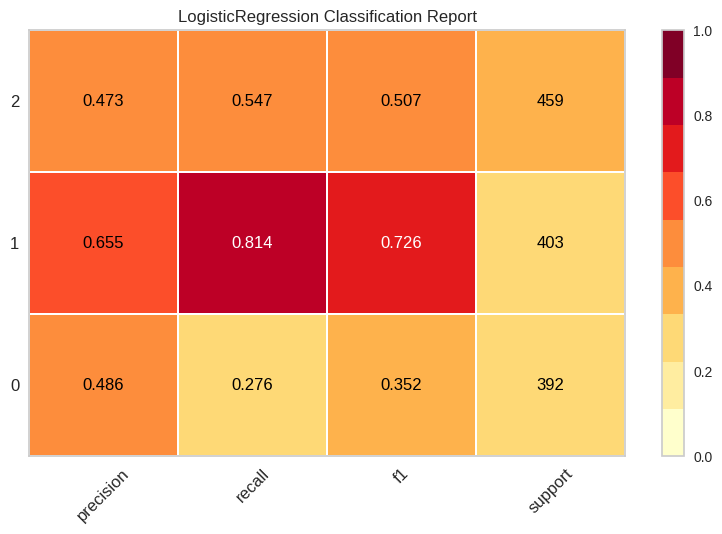

In [ ]:
# plot class report
plot_model(best, plot = 'class_report')

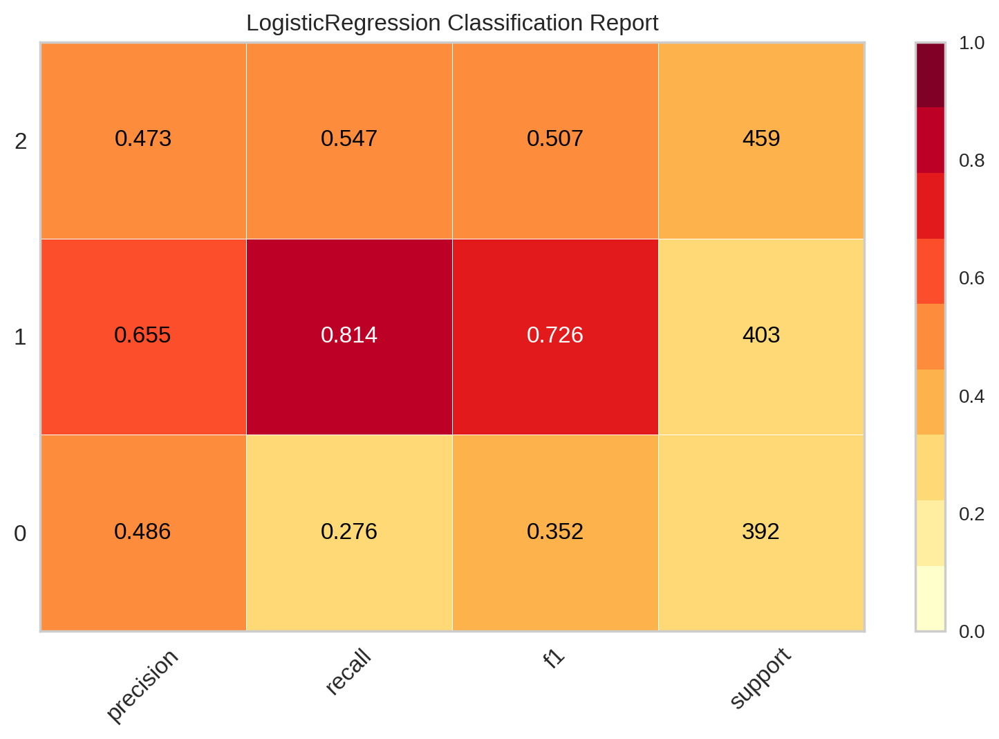

In [ ]:
# to control the scale of plot
plot_model(best, plot = 'class_report', scale = 2)

In [ ]:
# to save the plot
plot_model(best, plot = 'class_report', save=True)

'Class Report.png'

## ✅ Interpret Model

This function analyzes the predictions generated from a trained model. Most plots in this function are implemented based on the SHAP (Shapley Additive exPlanations).


In [ ]:
# train lightgbm model
lightgbm = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5188,0.7290,0.5188,0.5141,0.5159,0.2753,0.2756
1,0.5427,0.7402,0.5427,0.5478,0.5439,0.3098,0.3108
2,0.5461,0.7361,0.5461,0.5429,0.5443,0.3169,0.3171
3,0.5137,0.7108,0.5137,0.4987,0.5008,0.2647,0.2678
4,0.5685,0.7530,0.5685,0.5653,0.5658,0.3492,0.3500
5,0.5034,0.7400,0.5034,0.4920,0.4967,0.2543,0.2547
6,0.5651,0.7415,0.5651,0.5593,0.5598,0.3437,0.3452
7,0.5274,0.7406,0.5274,0.5132,0.5176,0.2910,0.2924
8,0.5274,0.7289,0.5274,0.5199,0.5226,0.2885,0.2891


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

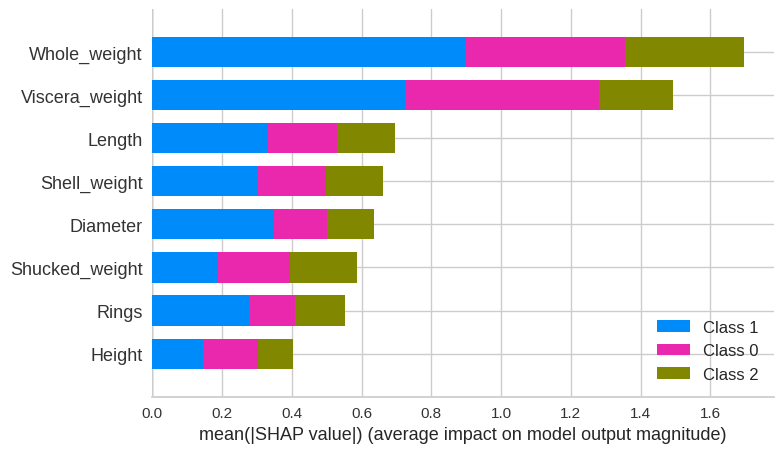

In [ ]:
# interpret summary model
interpret_model(lightgbm, plot = 'summary')

In [ ]:
# reason plot for test set observation 1
interpret_model(lightgbm, plot = 'reason', observation = 1)

## ✅ Get Leaderboard

This function returns the leaderboard of all models trained in the current setup.

In [ ]:
# get leaderboard
lb = get_leaderboard()
lb

Processing:   0%|          | 0/58 [00:00<?, ?it/s]

,Model Name,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Index,,,,,,,,,
0,Logistic Regression,"(TransformerWrapperWithInverse(exclude=None, i...",0.5566,0.7539,0.5566,0.5484,0.5400,0.3296,0.3366
1,K Neighbors Classifier,"(TransformerWrapperWithInverse(exclude=None, i...",0.5217,0.7083,0.5217,0.5174,0.5178,0.2830,0.2841
2,Naive Bayes,"(TransformerWrapperWithInverse(exclude=None, i...",0.5135,0.7276,0.5135,0.4900,0.4839,0.2774,0.2878
3,Decision Tree Classifier,"(TransformerWrapperWithInverse(exclude=None, i...",0.4837,0.6111,0.4837,0.4847,0.4834,0.2247,0.2250
4,SVM - Linear Kernel,"(TransformerWrapperWithInverse(exclude=None, i...",0.5563,0.0000,0.5563,0.5114,0.5155,0.3292,0.3529
5,Ridge Classifier,"(TransformerWrapperWithInverse(exclude=None, i...",0.5525,0.0000,0.5525,0.5398,0.5346,0.3264,0.3330
6,Random Forest Classifier,"(TransformerWrapperWithInverse(exclude=None, i...",0.5416,0.7406,0.5416,0.5346,0.5366,0.3095,0.3104
7,Quadratic Discriminant Analysis,"(TransformerWrapperWithInverse(exclude=None, i...",0.5265,0.7379,0.5265,0.5136,0.4942,0.2861,0.2990
8,Ada Boost Classifier,"(TransformerWrapperWithInverse(exclude=None, i...",0.5316,0.7280,0.5316,0.5142,0.5086,0.2920,0.2995


In [ ]:
# select the best model based on F1
lb.sort_values(by='F1', ascending=False)['Model'].iloc[0]

Pipeline(memory=Memory(location=None),
         steps=[('label_encoding',
                 TransformerWrapperWithInverse(exclude=None, include=None,
                                               transformer=LabelEncoder())),
                ('numerical_imputer',
                 TransformerWrapper(exclude=None,
                                    include=['Length', 'Diameter', 'Height',
                                             'Whole_weight', 'Shucked_weight',
                                             'Viscera_weight', 'Shell_weight',
                                             'Rings'],
                                    transformer=SimpleImputer(add_indicato...
                                                             random_state=123,
                                                             shuffle=True,
                                                             tol=0.001,
                                                             validation_fraction=0.1,
                                                             verbose=0,
                                                             warm_start=False)),
                                              ('Ridge Classifier',
                                               RidgeClassifier(alpha=1.0,
                                                               class_weight=None,
                                                               copy_X=True,
                                                               fit_intercept=True,
                                                               max_iter=None,
                                                               positive=False,
                                                               random_state=123,
                                                               solver='auto',
                                                               tol=0.0001))],
                                  flatten_transform=True, n_jobs=-1,
                                  verbose=False, voting='hard',
                                  weights=None)]],
         verbose=False)

## ✅ AutoML
This function returns the best model out of all trained models in the current setup based on the optimize parameter. Metrics evaluated can be accessed using the `get_metrics` function.

In [ ]:
automl()

VotingClassifier(estimators=[('Logistic Regression',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=1000,
                                                 multi_class='auto',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=123,
                                                 solver='lbfgs', tol=0.0001,
                                                 verbose=0, warm_start=False)),
                             ('SVM - Linear Kernel',
                              SGDClassifier(alpha=0.0001, average=False,
                                            c...
                                            penalty='l2', power_t=0.5,
                                            random_state=123, shuffle=True,
                                            tol=0.001, validation_fraction=0.1,
                                            verbose=0, warm_start=False)),
                             ('Ridge Classifier',
                              RidgeClassifier(alpha=1.0, class_weight=None,
                                              copy_X=True, fit_intercept=True,
                                              max_iter=None, positive=False,
                                              random_state=123, solver='auto',
                                              tol=0.0001))],
                 flatten_transform=True, n_jobs=-1, verbose=False,
                 voting='hard', weights=None)

## ✅ Create Docker
This function creates a `Dockerfile` and `requirements.txt` for productionalizing API end-point.

In [ ]:
create_docker('my_first_api')

Writing requirements.txt
Writing Dockerfile
Dockerfile and requirements.txt successfully created.
    To build image you have to run --> !docker image build -f "Dockerfile" -t IMAGE_NAME:IMAGE_TAG .
            


## ✅ Finalize Model
This function trains a given model on the entire dataset including the hold-out set.

In [ ]:
final_best = finalize_model(best)
final_best

Pipeline(memory=Memory(location=None),
         steps=[('label_encoding',
                 TransformerWrapperWithInverse(exclude=None, include=None,
                                               transformer=LabelEncoder())),
                ('numerical_imputer',
                 TransformerWrapper(exclude=None,
                                    include=['Length', 'Diameter', 'Height',
                                             'Whole_weight', 'Shucked_weight',
                                             'Viscera_weight', 'Shell_weight',
                                             'Rings'],
                                    transformer=SimpleImputer(add_indicato...
                 TransformerWrapper(exclude=None, include=None,
                                    transformer=MinMaxScaler(clip=False,
                                                             copy=True,
                                                             feature_range=(0,
                                                                            1)))),
                ('actual_estimator',
                 LogisticRegression(C=1.0, class_weight=None, dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=1000,
                                    multi_class='auto', n_jobs=None,
                                    penalty='l2', random_state=123,
                                    solver='lbfgs', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)

## ✅ Save / Load Model
This function saves the transformation pipeline and a trained model object into the current working directory as a pickle file for later use.

In [ ]:
# save model
save_model(best, 'my_first_model')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('label_encoding',
                  TransformerWrapperWithInverse(exclude=None, include=None,
                                                transformer=LabelEncoder())),
                 ('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Length', 'Diameter', 'Height',
                                              'Whole_weight', 'Shucked_weight',
                                              'Viscera_weight', 'Shell_weight',
                                              'Rings'],
                                     transformer=SimpleImputer(add_indicato...
                  TransformerWrapper(exclude=None, include=None,
                                     transformer=MinMaxScaler(clip=False,
                                                              copy=True,
                                                              feature_range=(0,
               

## ✅ Save / Load Experiment
This function saves all the experiment variables on disk, allowing to later resume without rerunning the setup function.

In [ ]:
# save experiment
save_experiment('my_experiment')

In [ ]:
# load experiment from disk
exp_from_disk = load_experiment('my_experiment', data=data)

,Description,Value
0,Session id,123
1,Target,Sex
2,Target type,Multiclass
3,Target mapping,"F: 0, I: 1, M: 2"
4,Original data shape,"(4177, 9)"
5,Transformed data shape,"(4177, 9)"
6,Transformed train set shape,"(2923, 9)"
7,Transformed test set shape,"(1254, 9)"
8,Numeric features,8
9,Preprocess,True


# **4) Pycaret Model Perfomance Improvement through Feature Engineering & Data Preparation in Multiclass Classification Task**

In this section of the project, I take the feature engineering and hyperparameter tuning insights I gained in the previous section to improve model performance.

Below, I only show the best performing model to keep this section brief, but the following was tested:


*   **Different Normalization Techniques:** (i.e. Standardization, minmax, etc.) Robust improved performance the most
*   **Ignoring Features** that were not good predictors of the 'Sex' class - it was found that model performed best with all 8 features retained in the training data
*   **Adding Polynomial Features:** This was found to improve model performance
*   **Fixing Class imbalance:** This was not found to improve model performance
*   **Transforming data:** This was not found to improve model performance
*   **Grouping and Binning Features:** This was not found to improve model performance
*   **Removing multicollinearity:** This was not found to improve model performance










In the previous section, we saw that not all eight features are great indicators of the output (plot below). Hence, I attempted to improve model performance by ignoring less important features - namely the bottom four predictor columns: 'Diameter', 'Length', 'Shell_weight', 'Rings'. However this actually served to hinder model performance, this all eight features were retained in the training data.

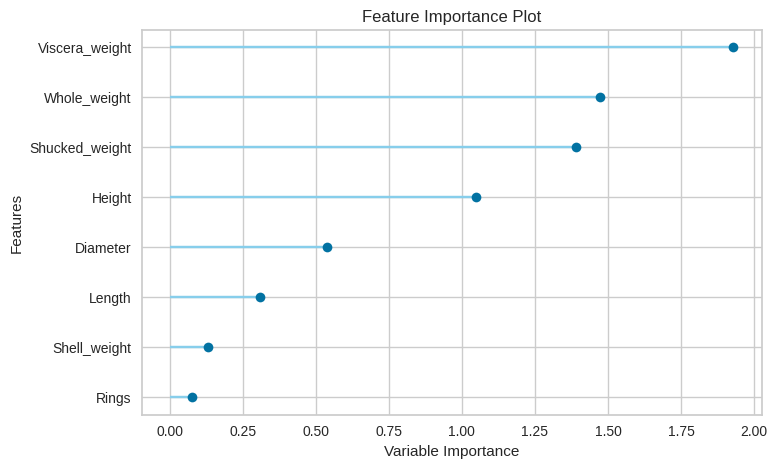

In [ ]:
# plot feature importance
plot_model(best_models, plot = 'feature')

Additionally, we saw from the Confusion Matrix (plotted below) that the models were good at identifying Abalone with the 'Sex' class Intersex (class 1), but struggle with Females (class 0) and Males (class 2) - with Female classification severely deteriorating model performance (only 25% recall in classifying Females). Therefore, I will also dig into this class of Abalones and try to identify what is causing the classification issue.

In [ ]:
correlation_matrix = data.corr()
correlation_matrix

,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
Length,1.000000,0.986812,0.827554,0.925261,0.897914,0.903018,0.897706,0.556720
Diameter,0.986812,1.000000,0.833684,0.925452,0.893162,0.899724,0.905330,0.574660
Height,0.827554,0.833684,1.000000,0.819221,0.774972,0.798319,0.817338,0.557467
Whole_weight,0.925261,0.925452,0.819221,1.000000,0.969405,0.966375,0.955355,0.540390
Shucked_weight,0.897914,0.893162,0.774972,0.969405,1.000000,0.931961,0.882617,0.420884
Viscera_weight,0.903018,0.899724,0.798319,0.966375,0.931961,1.000000,0.907656,0.503819
Shell_weight,0.897706,0.905330,0.817338,0.955355,0.882617,0.907656,1.000000,0.627574
Rings,0.556720,0.574660,0.557467,0.540390,0.420884,0.503819,0.627574,1.000000


We can see that all features are very highly correlated expect for 'Rings'

In [ ]:
# import ClassificationExperiment and init the class
from pycaret.classification import ClassificationExperiment
exp2 = ClassificationExperiment()

In [ ]:
#exp2.setup(data = data, target = 'Sex', fix_imbalance = True, normalize = True, feature_selection = True, polynomial_features = True, transformation = True)
exp2.setup(data = data, target = 'Sex', session_id = 123, normalize = True, normalize_method = 'robust', polynomial_features = True)

,Description,Value
0,Session id,123
1,Target,Sex
2,Target type,Multiclass
3,Target mapping,"F: 0, I: 1, M: 2"
4,Original data shape,"(4177, 9)"
5,Transformed data shape,"(4177, 45)"
6,Transformed train set shape,"(2923, 45)"
7,Transformed test set shape,"(1254, 45)"
8,Numeric features,8
9,Preprocess,True


In [ ]:
exp2.compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.5696,0.7653,0.5696,0.5584,0.5574,0.3510,0.3550,0.2760
ridge,Ridge Classifier,0.5621,0.0000,0.5621,0.5487,0.5466,0.3401,0.3453,0.1160
lda,Linear Discriminant Analysis,0.5580,0.7550,0.5580,0.5523,0.5498,0.3326,0.3359,0.0820
gbc,Gradient Boosting Classifier,0.5474,0.7466,0.5474,0.5355,0.5378,0.3175,0.3197,9.5680
ada,Ada Boost Classifier,0.5416,0.7287,0.5416,0.5262,0.5243,0.3073,0.3127,1.0950
et,Extra Trees Classifier,0.5399,0.7405,0.5399,0.5345,0.5352,0.3069,0.3081,0.5850
svm,SVM - Linear Kernel,0.5364,0.0000,0.5364,0.5219,0.5073,0.3060,0.3192,0.2250
rf,Random Forest Classifier,0.5361,0.7430,0.5361,0.5311,0.5326,0.3016,0.3022,1.2040
catboost,CatBoost Classifier,0.5358,0.7392,0.5358,0.5294,0.5311,0.3012,0.3021,34.9670
xgboost,Extreme Gradient Boosting,0.5337,0.7271,0.5337,0.5306,0.5314,0.2980,0.2985,1.8510


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

## Conclusion

we see that performance for Pycaret models with Feature Engineering & Hyperparamter Tuning top out at Accuracy: 57%, AUC = 0.77, Recall = 57%, Precision = 56% & F1 = 56% in muliclass classification of the 'Sex' column.

This is an improvement from the model performance on raw features, where Accuracy: 55%, AUC = 0.75, Recall = 55%, Precision = 55% & F1 = 54%

# **5) Pycaret Model Performance Improvement through One vs. All Multiclass Classification Approach**

From the previous sections, we see that performance for pycaret models top out at Accuracy: 57%, AUC = 0.77, Recall = 57%, Precision = 56% & F1 = 56 in muliclass classification of the 'Sex' column. Although the AUC score is good, the rest of the metrics perform quite poorly.

As mentioned in the AUC discussion in Section 2), AUC employs a one vs. all approach in multiclass classification (i.e. Male, not Male). In this section, I will test models using a one vs. all approach for each 'Sex' class: Female, Infant, Male.


## Female vs Not Female:

In [ ]:
#Copy and pasted Python import instructions from https://archive.ics.uci.edu/dataset/1/abalone

from ucimlrepo import fetch_ucirepo
import pandas as pd

# fetch dataset
abalone = fetch_ucirepo(id=1)

# data (as pandas dataframes)
X = abalone.data.features
y = abalone.data.targets

data = pd.concat([X, y], axis=1)

# metadata
print(abalone.metadata)

# variable information
print(abalone.variables)

#visualize full table
data

In [ ]:
F_not_F = data

for i in range(len(F_not_F.Sex)):

  if F_not_F.Sex[i]!= "F":
    F_not_F.Sex[i] = "Not F"


In [ ]:
F_not_F

,Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
0,Not F,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,Not F,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,Not F,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,Not F,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,F,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,Not F,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,Not F,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,F,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


In [ ]:
exp_F_not_F = ClassificationExperiment()

In [ ]:
exp_F_not_F.setup(data = F_not_F, target = 'Sex', session_id = 123, normalize = True, normalize_method = 'robust', polynomial_features = True)

,Description,Value
0,Session id,123
1,Target,Sex
2,Target type,Binary
3,Original data shape,"(4177, 9)"
4,Transformed data shape,"(4177, 45)"
5,Transformed train set shape,"(2923, 45)"
6,Transformed test set shape,"(1254, 45)"
7,Numeric features,8
8,Preprocess,True
9,Imputation type,simple


In [ ]:
exp_F_not_F.compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.6921,0.0000,0.9004,0.7209,0.8005,0.1595,0.1824,0.1110
lda,Linear Discriminant Analysis,0.6918,0.7147,0.8755,0.7297,0.7958,0.1868,0.2021,0.0960
lr,Logistic Regression,0.6914,0.7211,0.8909,0.7237,0.7985,0.1680,0.1877,0.5890
dummy,Dummy Classifier,0.6870,0.5000,1.0000,0.6870,0.8144,0.0000,0.0000,0.1070
catboost,CatBoost Classifier,0.6812,0.7000,0.8705,0.7225,0.7895,0.1549,0.1673,15.3530
ada,Ada Boost Classifier,0.6798,0.6866,0.8984,0.7116,0.7939,0.1160,0.1335,1.0080
qda,Quadratic Discriminant Analysis,0.6788,0.7004,0.8560,0.7258,0.7852,0.1631,0.1737,0.1210
gbc,Gradient Boosting Classifier,0.6750,0.6928,0.8825,0.7129,0.7885,0.1189,0.1330,2.9930
rf,Random Forest Classifier,0.6688,0.6949,0.8292,0.7274,0.7746,0.1590,0.1645,1.1500
svm,SVM - Linear Kernel,0.6681,0.0000,0.8534,0.7219,0.7761,0.1207,0.1387,0.1770


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, positive=False, random_state=123, solver='auto',
                tol=0.0001)

## Infant vs. Not Infant:

In [ ]:
#Copy and pasted Python import instructions from https://archive.ics.uci.edu/dataset/1/abalone

from ucimlrepo import fetch_ucirepo
import pandas as pd

# fetch dataset
abalone = fetch_ucirepo(id=1)

# data (as pandas dataframes)
X = abalone.data.features
y = abalone.data.targets

data = pd.concat([X, y], axis=1)

# metadata
print(abalone.metadata)

# variable information
print(abalone.variables)

#visualize full table
data

{'uci_id': 1, 'name': 'Abalone', 'repository_url': 'https://archive.ics.uci.edu/dataset/1/abalone', 'data_url': 'https://archive.ics.uci.edu/static/public/1/data.csv', 'abstract': 'Predict the age of abalone from physical measurements', 'area': 'Life Science', 'tasks': ['Classification', 'Regression'], 'characteristics': ['Tabular'], 'num_instances': 4177, 'num_features': 8, 'feature_types': ['Categorical', 'Integer', 'Real'], 'demographics': [], 'target_col': ['Rings'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1994, 'last_updated': 'Mon Aug 28 2023', 'dataset_doi': '10.24432/C55C7W', 'creators': ['Warwick Nash', 'Tracy Sellers', 'Simon Talbot', 'Andrew Cawthorn', 'Wes Ford'], 'intro_paper': None, 'additional_info': {'summary': 'Predicting the age of abalone from physical measurements.  The age of abalone is determined by cutting the shell through the cone, staining it, and counting the number of rings through a microscop

,Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,F,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,M,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,M,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,F,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


In [ ]:
I_not_I = data

for i in range(len(I_not_I.Sex)):

  if I_not_I.Sex[i]!= "I":
    I_not_I.Sex[i] = "Not I"

In [ ]:
I_not_I

,Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
0,Not I,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,Not I,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,Not I,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,Not I,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,Not I,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,Not I,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,Not I,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,Not I,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


In [ ]:
exp_I_not_I = ClassificationExperiment()

In [ ]:
exp_I_not_I.setup(data = I_not_I, target = 'Sex', session_id = 123, normalize = True, normalize_method = 'robust', polynomial_features = True)

,Description,Value
0,Session id,123
1,Target,Sex
2,Target type,Binary
3,Target mapping,"I: 0, Not I: 1"
4,Original data shape,"(4177, 9)"
5,Transformed data shape,"(4177, 45)"
6,Transformed train set shape,"(2923, 45)"
7,Transformed test set shape,"(1254, 45)"
8,Numeric features,8
9,Preprocess,True


In [ ]:
exp_I_not_I.compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.8433,0.8989,0.9062,0.8690,0.8870,0.6315,0.6337,15.5850
gbc,Gradient Boosting Classifier,0.8354,0.8923,0.8992,0.8645,0.8813,0.6133,0.6153,3.2380
rf,Random Forest Classifier,0.8341,0.8921,0.8962,0.8651,0.8801,0.6108,0.6127,1.3770
lr,Logistic Regression,0.8324,0.8975,0.8866,0.8696,0.8778,0.6109,0.6120,0.1830
lightgbm,Light Gradient Boosting Machine,0.8317,0.8906,0.8987,0.8602,0.8788,0.6036,0.6060,2.1630
et,Extra Trees Classifier,0.8313,0.8905,0.8941,0.8629,0.8781,0.6046,0.6062,0.6100
lda,Linear Discriminant Analysis,0.8289,0.8935,0.8810,0.8693,0.8749,0.6042,0.6050,0.1540
ridge,Ridge Classifier,0.8286,0.0000,0.8871,0.8645,0.8754,0.6007,0.6018,0.0590
xgboost,Extreme Gradient Boosting,0.8286,0.8828,0.8926,0.8606,0.8761,0.5982,0.6002,0.4490
ada,Ada Boost Classifier,0.8197,0.8798,0.8831,0.8566,0.8693,0.5786,0.5805,0.5940


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

## Male vs. Not Male:

In [ ]:
#Copy and pasted Python import instructions from https://archive.ics.uci.edu/dataset/1/abalone

from ucimlrepo import fetch_ucirepo
import pandas as pd

# fetch dataset
abalone = fetch_ucirepo(id=1)

# data (as pandas dataframes)
X = abalone.data.features
y = abalone.data.targets

data = pd.concat([X, y], axis=1)

# metadata
print(abalone.metadata)

# variable information
print(abalone.variables)

#visualize full table
data

{'uci_id': 1, 'name': 'Abalone', 'repository_url': 'https://archive.ics.uci.edu/dataset/1/abalone', 'data_url': 'https://archive.ics.uci.edu/static/public/1/data.csv', 'abstract': 'Predict the age of abalone from physical measurements', 'area': 'Life Science', 'tasks': ['Classification', 'Regression'], 'characteristics': ['Tabular'], 'num_instances': 4177, 'num_features': 8, 'feature_types': ['Categorical', 'Integer', 'Real'], 'demographics': [], 'target_col': ['Rings'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1994, 'last_updated': 'Mon Aug 28 2023', 'dataset_doi': '10.24432/C55C7W', 'creators': ['Warwick Nash', 'Tracy Sellers', 'Simon Talbot', 'Andrew Cawthorn', 'Wes Ford'], 'intro_paper': None, 'additional_info': {'summary': 'Predicting the age of abalone from physical measurements.  The age of abalone is determined by cutting the shell through the cone, staining it, and counting the number of rings through a microscop

,Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,F,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,M,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,M,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,F,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


In [ ]:
M_not_M = data

for i in range(len(M_not_M.Sex)):

  if M_not_M.Sex[i]!= "M":
    M_not_M.Sex[i] = "Not M"




In [ ]:
M_not_M

,Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,Not M,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,Not M,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,Not M,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,M,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,M,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,Not M,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


In [ ]:
exp_M_not_M = ClassificationExperiment()

In [ ]:
exp_M_not_M.setup(data = M_not_M, target = 'Sex', session_id = 123, normalize = True, normalize_method = 'robust', polynomial_features = True)

,Description,Value
0,Session id,123
1,Target,Sex
2,Target type,Binary
3,Target mapping,"M: 0, Not M: 1"
4,Original data shape,"(4177, 9)"
5,Transformed data shape,"(4177, 45)"
6,Transformed train set shape,"(2923, 45)"
7,Transformed test set shape,"(1254, 45)"
8,Numeric features,8
9,Preprocess,True


In [ ]:
exp_M_not_M.compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.6456,0.6664,0.8544,0.6742,0.7534,0.1528,0.1680,1.0970
ridge,Ridge Classifier,0.6408,0.0000,0.8528,0.6706,0.7506,0.1398,0.1539,0.0600
lda,Linear Discriminant Analysis,0.6360,0.6667,0.8312,0.6724,0.7432,0.1409,0.1512,0.0840
catboost,CatBoost Classifier,0.6360,0.6677,0.8215,0.6753,0.7411,0.1473,0.1557,16.1080
dummy,Dummy Classifier,0.6343,0.5000,1.0000,0.6343,0.7762,0.0000,0.0000,0.1740
gbc,Gradient Boosting Classifier,0.6292,0.6593,0.8188,0.6700,0.7368,0.1297,0.1378,3.5190
et,Extra Trees Classifier,0.6223,0.6505,0.7600,0.6813,0.7183,0.1500,0.1523,0.5130
svm,SVM - Linear Kernel,0.6216,0.0000,0.8561,0.6567,0.7377,0.0773,0.0999,0.0810
qda,Quadratic Discriminant Analysis,0.6216,0.6448,0.8086,0.6671,0.7303,0.1140,0.1199,0.0680
nb,Naive Bayes,0.6213,0.6536,0.6587,0.7208,0.6877,0.2087,0.2106,0.0670


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

## Results and Conclusion

From the results above, we see significant performance gains across every metric when using one vs. all classification in a Mulitclassification problem. Below is a comparison of best figures achieved by Pycaret models between the old model and new ones.


**Original one vs. one Model (Logistic Regression):**
*   Accuracy: 57%
*   AUC: 0.77
*   Recall: 57%
*   Precision: 55.9%
*   F1: 55.7%

**Female vs. Not Female (Ridge Classifier):**
*   Accuracy: 69.2%
*   AUC: 0.72
*   Recall: 90.0%
*   Precision: 72.1%
*   F1: 80.0%

**Infant vs. Not Infant (CatBoost Classifier):**
*   Accuracy: 84.3%
*   AUC: 0.90
*   Recall: 90.1%
*   Precision: 86.9%
*   F1: 88.7%

**Male vs. Not Male:**
*   Accuracy: 64.6%
*   AUC: 0.67
*   Recall: 85.4%
*   Precision: 67.4%
*   F1: 75.3%

**New One vs. Rest Overall Average Performance:**
*   Accuracy: 72.6%
*   AUC: 0.77
*   Recall: 85.4%
*   Precision: 75.4%
*   F1: 81.3%

Thus we see that using One vs. All classification achieves the same AUC as the original One vs. One model while significantly boosting all model other performance metrics Additionally, we have the ability to see which classes the model excels in classifying (Infant) and which it struggles with (Male & Female) which helps in user discretion when making decisions based on model predictions.

# **6) Use of Tensorflow Neural Networks for comparison to Pycaret Model Performance**

In this section, we leave the Pycaret framework and test out another very popular Machine Learning library in Python: **Tensorflow**. I develop a Neural Network model to compare performance to the Pycaret models created in previous sections.

Let us first once again visualize our data so we may construct a neural network model:

In [ ]:
import tensorflow as tf

#Copy and pasted Python import instructions from https://archive.ics.uci.edu/dataset/1/abalone

from ucimlrepo import fetch_ucirepo
import pandas as pd

# fetch dataset
abalone = fetch_ucirepo(id=1)

# data (as pandas dataframes)
X = abalone.data.features
y = abalone.data.targets

data = pd.concat([X, y], axis=1)

# metadata
print(abalone.metadata)

# variable information
print(abalone.variables)

#visualize full table
data

{'uci_id': 1, 'name': 'Abalone', 'repository_url': 'https://archive.ics.uci.edu/dataset/1/abalone', 'data_url': 'https://archive.ics.uci.edu/static/public/1/data.csv', 'abstract': 'Predict the age of abalone from physical measurements', 'area': 'Life Science', 'tasks': ['Classification', 'Regression'], 'characteristics': ['Tabular'], 'num_instances': 4177, 'num_features': 8, 'feature_types': ['Categorical', 'Integer', 'Real'], 'demographics': [], 'target_col': ['Rings'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1994, 'last_updated': 'Mon Aug 28 2023', 'dataset_doi': '10.24432/C55C7W', 'creators': ['Warwick Nash', 'Tracy Sellers', 'Simon Talbot', 'Andrew Cawthorn', 'Wes Ford'], 'intro_paper': None, 'additional_info': {'summary': 'Predicting the age of abalone from physical measurements.  The age of abalone is determined by cutting the shell through the cone, staining it, and counting the number of rings through a microscop

,Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,F,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,M,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,M,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,F,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split

In [ ]:
#create X and y datasets:

X = data.drop('Sex', axis = 1)
y = data[['Sex']].copy()

As Tensorflow handles multiclass categorical target values differently then Pycaret, we must convert this class to numeric representations across three columns using one-hot encoding.

In [ ]:
# Define the unique class labels
unique_classes = y.Sex.unique()

# Create a mapping from class labels to integer values
class_to_int = {class_label: i for i, class_label in enumerate(unique_classes)}

# Encode 'y' using the mapping
y_encoded = y.Sex.map(class_to_int)

# Convert the encoded labels to one-hot encoding
y_one_hot = tf.one_hot(y_encoded, depth=len(unique_classes))

In [ ]:
y_one_hot_df = pd.DataFrame(y_one_hot.numpy(), columns=unique_classes)
y_one_hot_df

,M,F,I
0,1.0,0.0,0.0
1,1.0,0.0,0.0
2,0.0,1.0,0.0
3,1.0,0.0,0.0
4,0.0,0.0,1.0
...,...,...,...
4172,0.0,1.0,0.0
4173,1.0,0.0,0.0
4174,1.0,0.0,0.0
4175,0.0,1.0,0.0


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Split the 'X' and 'y' data into train & validation sets with 85% & 15% splits
X_train, X_val, y_train, y_val = train_test_split(X, y_one_hot_df, test_size=0.15, random_state=42)




In [ ]:
# Used to build and deploy machine learning apps
import tensorflow as tf

# Deep Learning API for creating Neural Networks (Runs on TensorFlow)
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow import math
#from keras.utils.vis_utils import plot_model

# Scikit-learn : machine learning library
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder

In [ ]:
X_train = tf.keras.utils.normalize(X_train, axis=1)
X_val = tf.keras.utils.normalize(X_val, axis=1)

In [ ]:
X_train.shape, y_train.shape, X_val.shape, y_val.shape

((3550, 8), (3550, 3), (627, 8), (627, 3))

In [ ]:
import tensorflow as tf
from tensorflow import keras

# Create a Sequential model
model = keras.Sequential()

# Input layer with shape (8,)
model.add(keras.layers.Input(shape=(8,)))

# Add hidden layers
model.add(keras.layers.Dense(1028, activation='relu'))
# model.add(keras.layers.Dropout(0.2))
model.add(keras.layers.Dense(512, activation='relu'))
model.add(keras.layers.Dropout(0.15))
model.add(keras.layers.Dense(128, activation='relu'))
# Output layer with 3 units for multiclass classification and softmax activation
model.add(keras.layers.Dense(3, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model architecture
model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 1028)              9252      
                                                                 
 dense_5 (Dense)             (None, 512)               526848    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_6 (Dense)             (None, 128)               65664     
                                                                 
 dense_7 (Dense)             (None, 3)                 387       
                                                                 
Total params: 602151 (2.30 MB)
Trainable params: 602151 (2.30 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
import tensorflow as tf
from tensorflow import keras

# Training the model
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=5, batch_size=16)

# Evaluate the model on the validation data
loss, accuracy = model.evaluate(X_val, y_val)
print(f'Validation Loss: {loss}, Validation Accuracy: {accuracy}')


Epoch 1/5
222/222 [==============================] - 3s 11ms/step - loss: 1.0111 - accuracy: 0.4493 - val_loss: 0.9221 - val_accuracy: 0.4896
Epoch 2/5
222/222 [==============================] - 2s 10ms/step - loss: 0.9365 - accuracy: 0.4983 - val_loss: 0.9201 - val_accuracy: 0.4896
Epoch 3/5
222/222 [==============================] - 2s 10ms/step - loss: 0.8977 - accuracy: 0.5208 - val_loss: 0.8528 - val_accuracy: 0.5566
Epoch 4/5
222/222 [==============================] - 2s 10ms/step - loss: 0.8866 - accuracy: 0.5239 - val_loss: 0.8524 - val_accuracy: 0.5566
Epoch 5/5
20/20 [==============================] - 0s 3ms/step - loss: 0.8480 - accuracy: 0.5630
Validation Loss: 0.8479542136192322, Validation Accuracy: 0.5629984140396118


##Conclusion

Thus we see that the Tensorflow Neural Network achieves a Validation Accuracy of 69.1%, out performing the original one vs. one model, but slightly underperforming the overall average accuracy of the one vs. all models developed in Section 5.

# **7) Project Conclusion**

In this project, eight physical features of the Abalone dataset were used to train Machine Learning models in the task of Multiclass Classification of the 'Sex' target column. This column contained three different classes: Male, Infant and Female.

Comparing traditional Multiclass Classification models in Pycaret, one vs. all classification models in Pycaret and Tensorflow Neural Networks, it was determined that the one vs. all Pycaret model performed the best.

Additionally, we observed that Feature Engineering & Hyperparameter tuning had positive impacts on model performance.